# Video segments: frames, shots and scenes

_Video time segmentation_ is an important data preparation step that can help unlock the full potential of video content for analysis and automation. By breaking down a video into meaningful segments, you can better understand the structure and context of the content, enabling a wide range of applications such as:

* Identifying key events, scenes, or chapters within the video
* Inserting metadata like ad markers or chapter markers
* Reusing relevant clips or segments for new purposes
* Applying advanced analytics and foundation models to specific parts of the video


![Video file decomposed into frames, shots and scenes](./static/images/01-visual-segments.jpg) 

***Figure:** Video file decomposed into frames, shots (numbered), and scenes (colored)*


In this notebook, you'll explore techniques to decompose a video into smaller segments using visual cues. Specifically, you'll:

* Break down the video into frames, shots, and scenes using visual analysis.
* Generate composite images for video segments that can be used in prompts to Foundation Models (FMs) on Amazon Bedrock to generate insights about the content of video clips.
* Practice prompt engineering with a Foundation Model to understand video content.

By the end of this notebook, you'll have a collection of segmentations for your video that can serve as a foundation for further analysis, automation, and reuse of the video assets. 

The outputs of this notebook will be used in the use case sections later on in this workshop.  



<div class="alert alert-block alert-info">
💡 We'll be using some Python libraries to accomplish the segmentation tasks during this part of the workshop.  The libraries are in the <b>lib/</b> folder of this project if you would like to dive deep into the code.  We are not going in to all the implementation details for this section because we want to leave more time for focusing on prompt engineering and solving use cases.
</div>

<div class="alert alert-block alert-info">
💡 Video segmentation can be done along the temporal dimension or along the spatial dimension.  In the context of this notebook, the term “segmentation” will always be <i>temporal (time) segmentation</i>.
</div>

### Key terms and definitions

You can refer back to this section if you want the definition of terms used in the notebook.

- **Frame** - frame image extracted from the video content
- **Frame sampling** - the selection of a subset of representative frames from a video
- **Shot** - continuous sequences of frames between two edits or cuts that defines one action
- **Scene** - continuous sequence of action taking place in a specific location and time, consisting of a series of shots.
- **Frame accurate timestamp** - a timestamp that can be mapped to a specific frame.  Frame accurate timestamps are useful for synchronization of video elements

### Workflow

The purpose of this lab is to give hands-on practice working with the visual elements of video at the frame, shot, and scene level and practice prompt engineering with frame sequences that represent video clips.  We'll be working with AWS services from the SageMaker notebook throughout the activity.

![scene detection and contextualization workflow](./static/images/01-scenes-shots-workflow-w-ouputs-drawio.png)

<div class="alert alert-block alert-info">
💡 Click on the list icon in the left navigation panel in this Jupyter notebook to see the outline of the notebook and where you currently are.
</div>



## Prerequisites

### Import python packages

In [1]:
from pathlib import Path
import os
import json
import boto3
from botocore.exceptions import ClientError
from termcolor import colored
from IPython.display import JSON
from IPython.display import Video
from IPython.display import Image as DisplayImage
from lib.frames import VideoFrames
from lib.shots import Shots
from lib.scenes import Scenes
from lib.transcript import Transcript
from lib import util
import requests
from tqdm import tqdm
from lib import frame_utils
from PIL import Image, ImageDraw, ImageFont
import time
from functools import cmp_to_key
import ffmpeg
import base64

### Retrieve saved values from previous notebooks

To run this notebook, you need to have run the previous notebook: [00_prerequisites.ipynb](./00-prequisites.ipynb), where you installed package dependencies and gathered some information from the SageMaker environment.

In [2]:
# Get variables from the previous notebook
%store -r

In [3]:
%store

Stored variables and their in-db values:
sagemaker_resources             -> {'bucket': 'sagemaker-us-west-2-376678947624', 'ro
session                         -> {'bucket': 'sagemaker-us-west-2-376678947624', 'Me
video                           -> {'path': 'Netflix_Open_Content_Meridian.mp4', 'url


In [4]:
sts_client = boto3.client('sts')

def get_account_id():
    '''
    Returns the current account ID
    '''
    account_id = sts_client.get_caller_identity()['Account']
    return account_id

### Download the sample video

In [5]:
def download_video(url: str, output_path: str) -> str:
    """
    Download test video if not already present
    """
    
    if os.path.exists(output_path):
        print(f"Video already exists at {output_path}")
        return output_path
    
    print("Downloading test video...")
    response = requests.get(url, stream=True)
    total_size = int(response.headers.get('content-length', 0))
    
    with open(output_path, 'wb') as file, tqdm(
        desc=output_path,
        total=total_size,
        unit='iB',
        unit_scale=True,
        unit_divisor=1024,
    ) as pbar:
        for data in response.iter_content(chunk_size=1024):
            size = file.write(data)
            pbar.update(size)
            
    return

### Download the sample video

* Meridian, 2016, Mystery from [Netflix](https://opencontent.netflix.com/) - This content is available under the [Creative Commons Attribution 4.0 International Public License](https://creativecommons.org/licenses/by/4.0/legalcode)

The next cell will select the video that will be used for the rest of the lab.  The default is Meridian.  If you want to change it you can modify the line that sets `video['path']` to use a different video.

<div class="alert alert-block alert-info">
We recommend you run the workshop with <b>Meridian</b> the first time through, as some visualization choices are made to work well with that content. 
</div>

In [6]:
video = {}

# Video Alternatives
# Drama
MERIDIAN='Netflix_Open_Content_Meridian.mp4'

video["path"] = MERIDIAN
video["url"] = f"https://ws-assets-prod-iad-r-pdx-f3b3f9f1a7d6a3d0.s3.us-west-2.amazonaws.com/7db2455e-0fa6-4f6d-9973-84daccd6421f/{video['path']}"

video["output_dir"] = Path(video["path"]).stem

download_video(video["url"], video["path"])

Video(url=video["url"], width=640, height=360, html_attributes="controls muted autoplay")

Netflix_Open_Content_Meridian.mp4: 100%|██████████| 47.2M/47.2M [00:00<00:00, 82.2MiB/s]


# Sample frames 

In this section you will extract video frames at one frame per second with a 392×220 pixel resolution.  These settings are optimized for visual quality and computational efficiency through numerous experiments. In this process, we sample one frame per second.

<div class="alert alert-block alert-info">
💡 392×220 pixel resolution is chosen to optimize the number of frames we can present to our chosen Foundation Model, Anthropic Claude Sonnet 3, while still retaining the level of detail we need for our use cases.  Different use cases may use higher or lower resolutions for lower cost or higher quality. 
</div>

<div class="alert alert-block alert-info">
💡 One frame per second sampling is a design choice that is suitable for the content used here, but can be adjusted for high-motion, high-frame-rate videos such as sports or more static video such as newsroom footage.
</div>

### Extract frames from the video

You'll be using a Python package, [VideoFrames](./lib/frames.py), to work with the video at the frame level.  This package is available on GitHub.  When you call the main method of VideoFrames, it will do the following steps to help prepare the video for frame based analysis with machine learning:

1. Extract frames from the video, sampling at the specified frame rate, and store the resulting images in the folder `./<video name>/frames/`.
2. The resulting frame metadata contains the following attributes for each frame:

* **timestamp_millis** — the timestamp, in milliseconds, where the frame appears in the video.  We'll use this timestamp to related video analysis results back to the video timeline.
* **image_file** — the location of the image in the `frames` folder.
* **id** - the unique frame id

Let's give it a try. 

⏳ Generating frames will take a few minutes to process.

In [7]:
# Number of frames to sample per second of video
FRAME_SAMPLING_RATE = 1

video["frames"] = VideoFrames(video["path"], session['bucket'], max_res=(392, 220), sample_rate_fps=FRAME_SAMPLING_RATE, force=False)

 Extracting frames ...
  Resizing: 1280x720 -> 392x220 (Progressive? True)
  Command: ['ffmpeg', '-i', 'Netflix_Open_Content_Meridian.mp4', '-vf', "select='eq(n,0) + not(eq(n,0))*gte(t-prev_selected_t,1.0)',showinfo,scale=392x220", '-vsync', '0', '-qmin', '1', '-q:v', '1', '-f', 'image2', './Netflix_Open_Content_Meridian/frames/frames%07d.jpg']
  Elapsed time: 59.63s
  Frames extracted: 719


In [8]:
display(JSON(video["frames"].frames[0], root="first frame"))

<IPython.core.display.JSON object>

### Visualize the extracted frames

Next, let's visualize the extracted frames of the video.  

<div class="alert alert-block alert-info">
🤔 Do you notice any visual patterns in the frames? Based on the frames, can you predict how many shots are in the video?
</div>

 


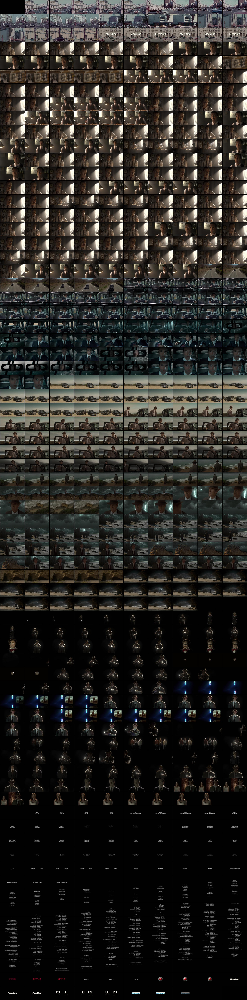

In [9]:
video['frames'].display_frames(start=0, end=len(video['frames'].frames))

# Detect shots

A shot is a continuous sequence of frames between two edits or cuts that define one action.  Usually, a shot represents a single camera position, but sometimes, shots may contain camera movements such as panning or zooming.  Frames that belong to the same shot should be similar.  Therefore, one way to implement shot detection would be to use image embeddings such as Amazon [Titan Multimodal Embeddings](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-multiemb-models.html) to group similar frames to shots.   However, since we are operating on sampled frames, the accuracy of timestamps for the shots would be limited by our frame sampling rate.

For use cases like ad insertion, editing and search, it is ideal to use **frame accurate** timestamps that identify the exact frame where the shots begin and end.  [Amazon Rekognition's Segment API](https://docs.aws.amazon.com/rekognition/latest/dg/segments.html) is a video analysis service that automatically detects technical cues and shot boundaries in video content which provides frame accurate timestamps for each shot boundary.

Use the [Shots](lib/shots.py) Python library to generate shots using the Amazon Rekognition's Shot Segment API and map the shots to the frames we sampled in the previous step.  We'll use this result to build large grouping of shots into scenes. 

## Shots library

<div class="alert alert-block alert-info">
<b>Note</b>: The code for shot detection is located in the <b>lib</b> folder of this project if you want to dive deeper, but the objective of this exercise is to understand the concept of a shot.    
</div>

Click the link to open [lib/shots.py](lib/shots.py)

## Run shot detection

In [10]:
video["shots"] = Shots(video["frames"], method="RekognitionShots")

print(f"Number of shots: {len(video['shots'].shots)} from {len(video['frames'].frames)} frames")

Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
Amazon Rekognition Shot Detection JobStatus = IN_PROGRESS
JobStatus = SUCCEEDED
Number of shots: 94 from 719 frames


Take a moment to look at the metadata for a sample shot from the results.  Each shot contains:

* **method** - the method used to group frames into shots.  Possible values are `SimilarFrames` or `RekognitionShots`
* **start_ms** - the starting timestamp of the shot
* **end_ms** - the ending timestamp of the shot
* **duration_ms** - the duration of the shot
* **video_asset_dir** - the location of the metadata collected for this video
* **start_frame_id** - the frame the shot begins with
* **end_frame_id** - the frame the shot ends with
* **composite_images** - a series of equal sized frame grids containing the frames for the shots.  Composite images can be used as inputs to multi-modal foundation models to generate insights about the shot.

Show metadata for shot 1

In [11]:
display(JSON(video["shots"].shots[1]))

<IPython.core.display.JSON object>

The `Shots` method creates a set of composite images consisting of the frames in each shot.  We will be using these composite images later on as inputs to Anthropic Claude Sonnet 3 on Amazon Bedrock to generate inferences to understand what is happening in the shots.  For now, you can examine the resulting composite images to visualize the shots. 

Show the composite images for shot 1. 


Shot 1 Composite image file 1 of 1: ./Netflix_Open_Content_Meridian/shots/shot_frames0000003-frames0000006.jpg



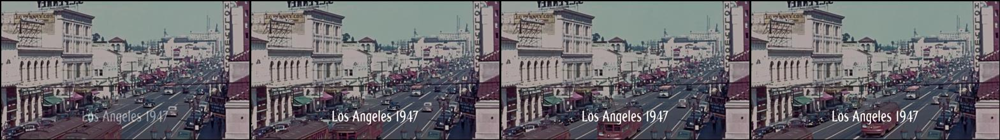

In [12]:
shot = video["shots"].shots[1]
for idx, composite_image in enumerate(shot['composite_images']):
    
    print (f'\nShot {shot["id"] } Composite image file { idx+1 } of { len(shot["composite_images"]) }: { composite_image["file"] }\n')
    display(DisplayImage(filename=composite_image['file']))


Before we move on to scene detection, let's take a look at all of the generated shots.

<div class="alert alert-block alert-info">
💡 Use the scroll bar in the output box to view the shots. 
</div>


SHOT 0: frames 0 to 0 =======



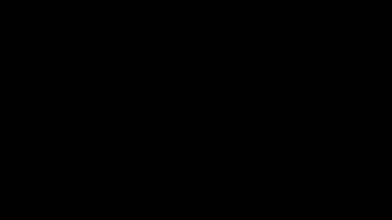


SHOT 1: frames 2 to 5 =======



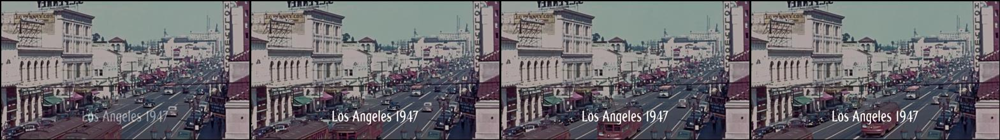


SHOT 2: frames 6 to 9 =======



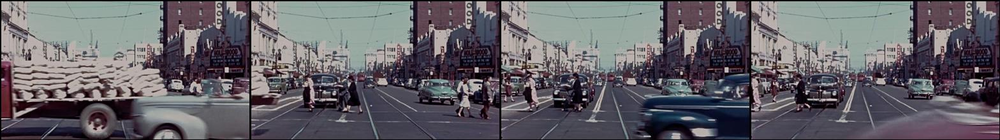


SHOT 3: frames 10 to 13 =======



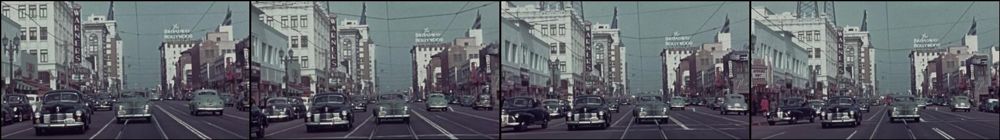


SHOT 4: frames 14 to 15 =======



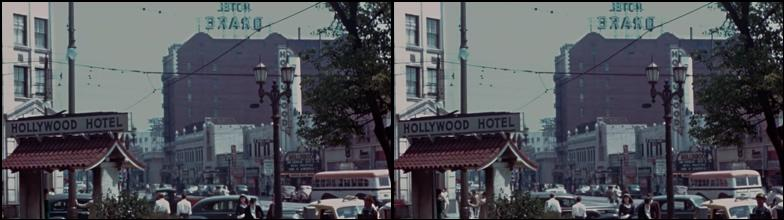


SHOT 5: frames 16 to 17 =======



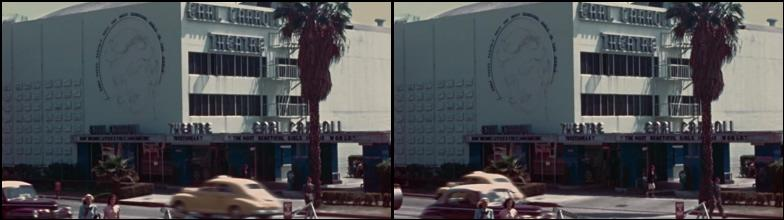


SHOT 6: frames 18 to 20 =======



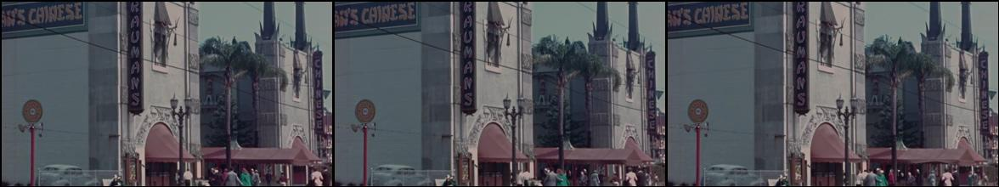


SHOT 7: frames 21 to 23 =======



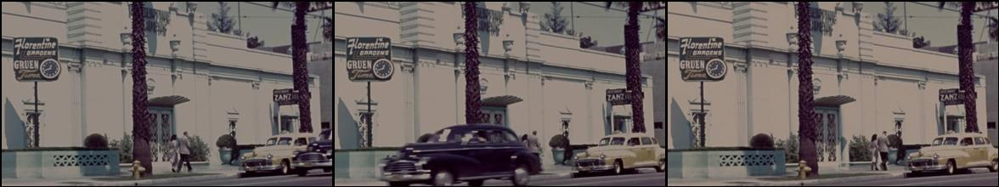


SHOT 8: frames 24 to 29 =======



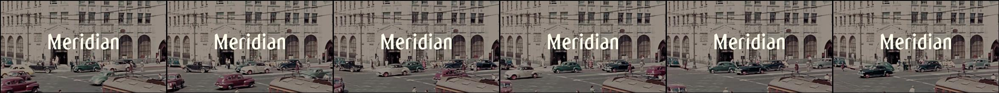


SHOT 9: frames 30 to 36 =======



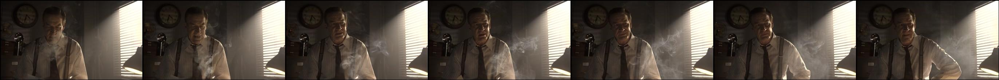


SHOT 10: frames 37 to 45 =======



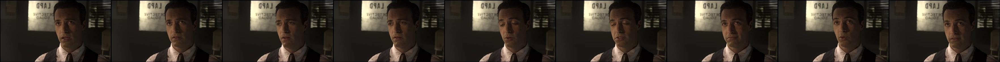


SHOT 11: frames 46 to 48 =======



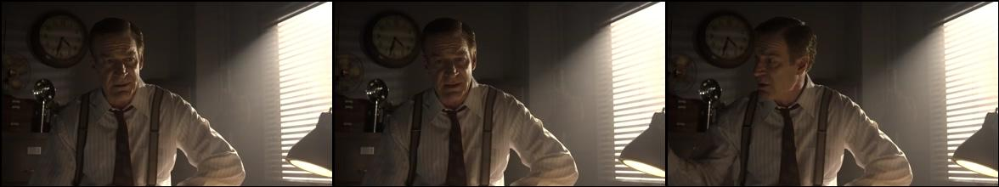


SHOT 12: frames 49 to 54 =======



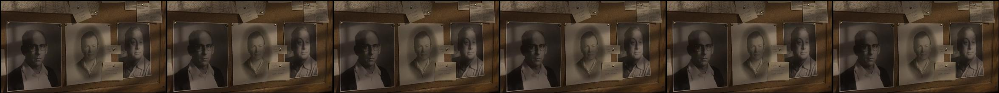


SHOT 13: frames 55 to 58 =======



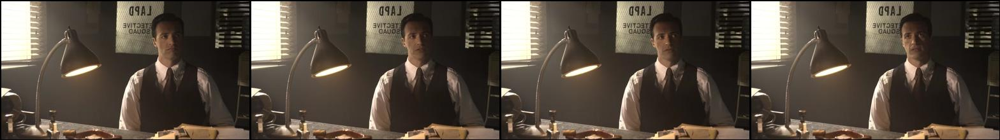


SHOT 14: frames 59 to 71 =======



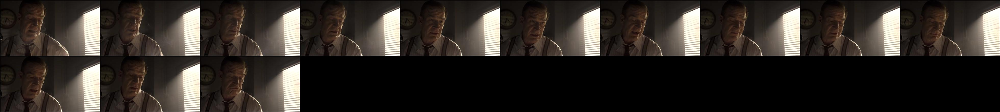


SHOT 15: frames 72 to 75 =======



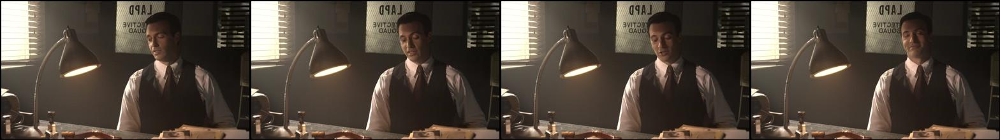


SHOT 16: frames 76 to 80 =======



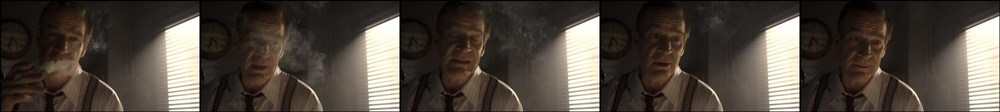


SHOT 17: frames 81 to 85 =======



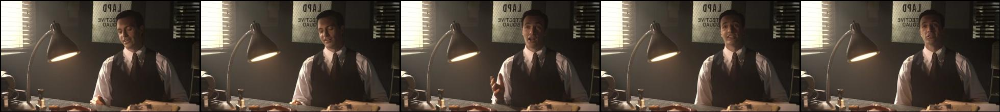


SHOT 18: frames 86 to 87 =======



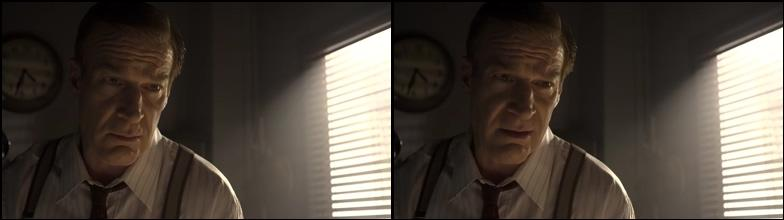


SHOT 19: frames 88 to 89 =======



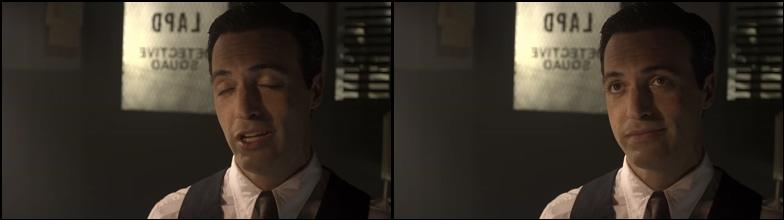


SHOT 20: frames 90 to 99 =======



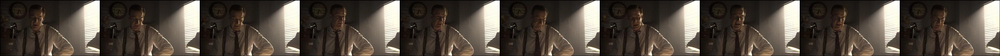


SHOT 21: frames 100 to 104 =======



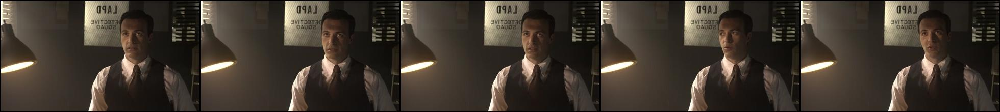


SHOT 22: frames 105 to 108 =======



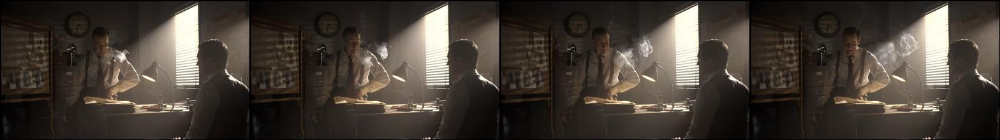


SHOT 23: frames 109 to 110 =======



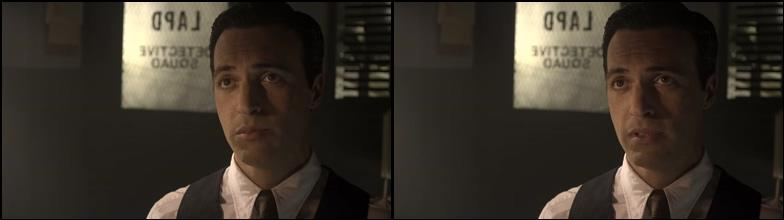


SHOT 24: frames 111 to 118 =======



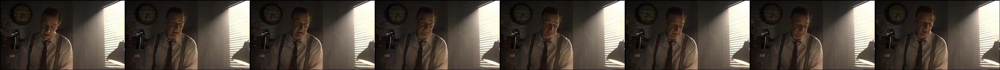


SHOT 25: frames 119 to 121 =======



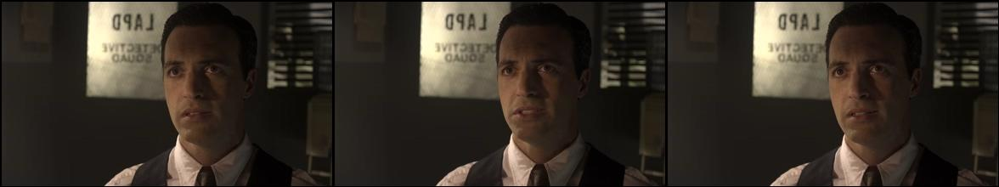


SHOT 26: frames 122 to 133 =======



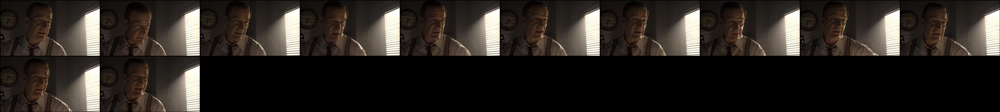


SHOT 27: frames 134 to 137 =======



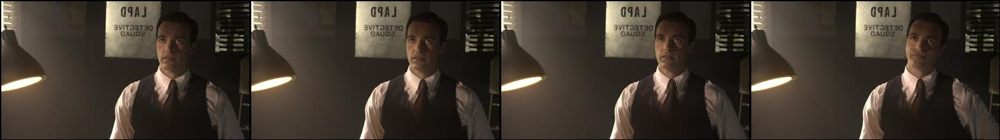


SHOT 28: frames 138 to 145 =======



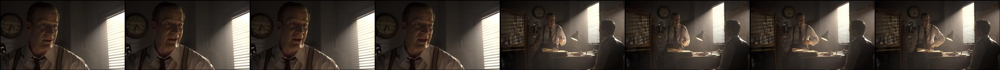


SHOT 29: frames 146 to 165 =======



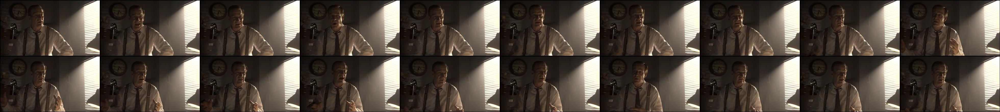


SHOT 30: frames 166 to 168 =======



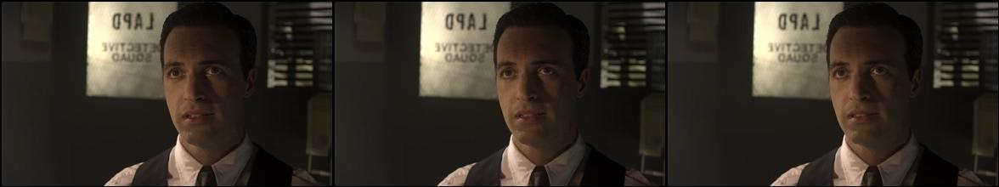


SHOT 31: frames 169 to 175 =======



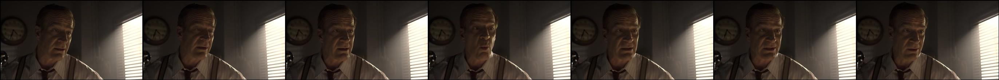


SHOT 32: frames 176 to 185 =======



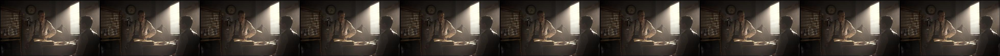


SHOT 33: frames 186 to 190 =======



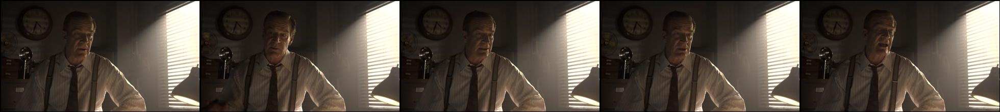


SHOT 34: frames 191 to 197 =======



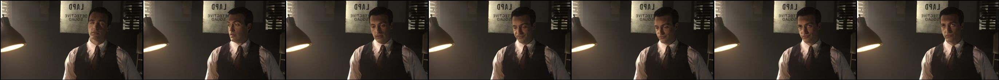


SHOT 35: frames 198 to 204 =======



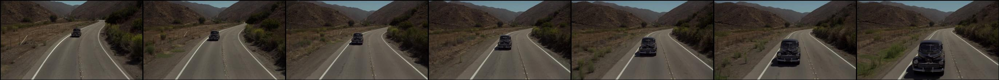


SHOT 36: frames 205 to 236 =======



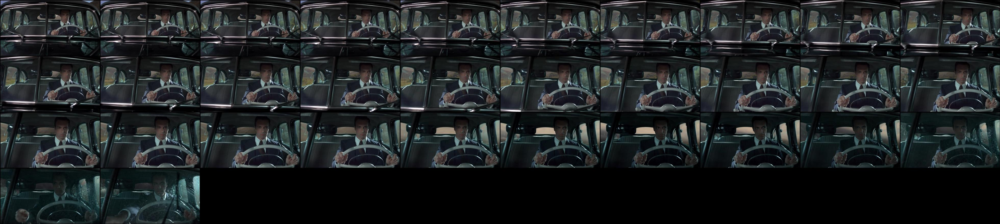


SHOT 37: frames 237 to 238 =======



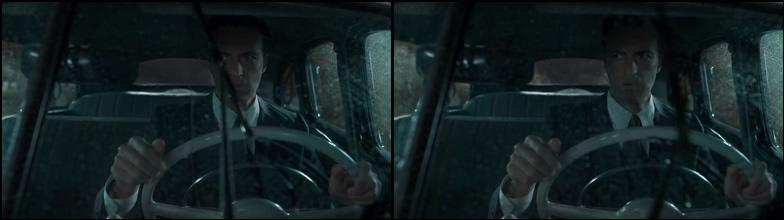


SHOT 38: frames 239 to 239 =======



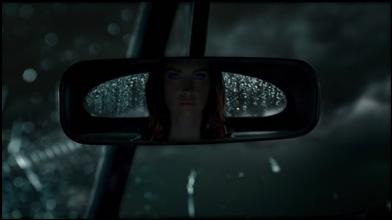


SHOT 39: frames 240 to 240 =======



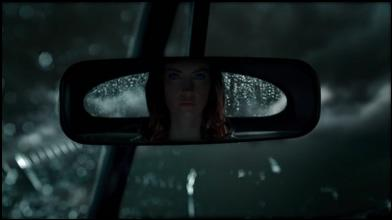


SHOT 40: frames 241 to 253 =======



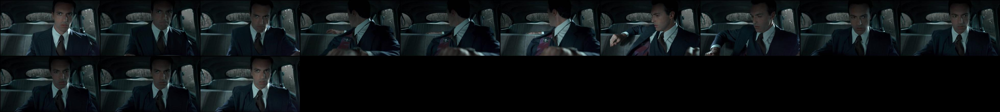


SHOT 41: frames 254 to 254 =======



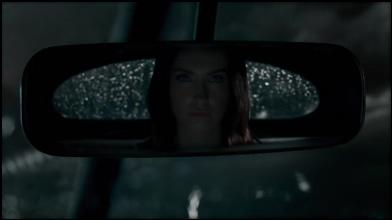


SHOT 42: frames 255 to 255 =======



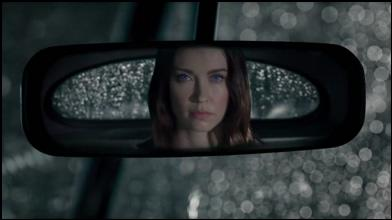


SHOT 43: frames 256 to 256 =======



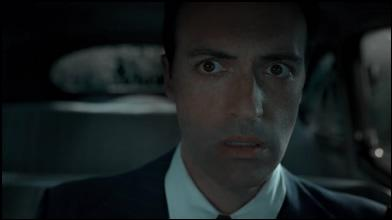


SHOT 44: frames 257 to 257 =======



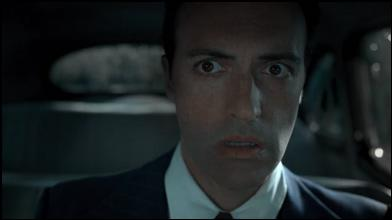


SHOT 45: frames 258 to 259 =======



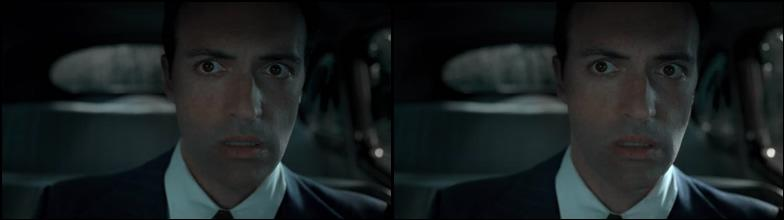


SHOT 46: frames 260 to 261 =======



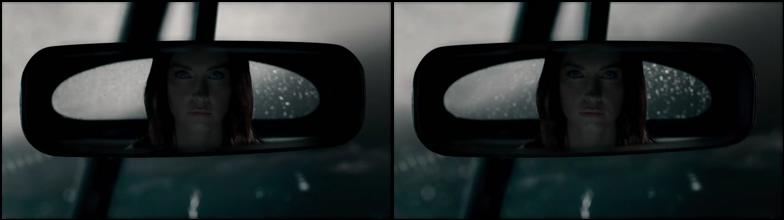


SHOT 47: frames 262 to 263 =======



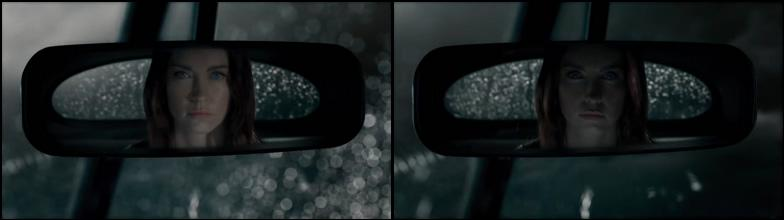


SHOT 48: frames 264 to 264 =======



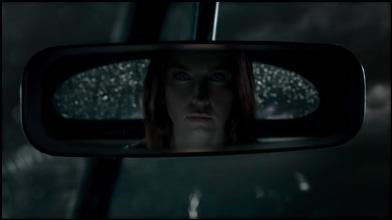


SHOT 49: frames 265 to 265 =======



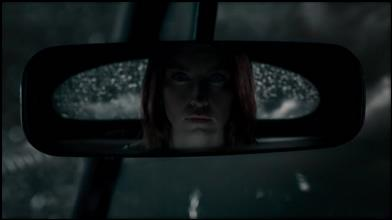


SHOT 50: frames 266 to 267 =======



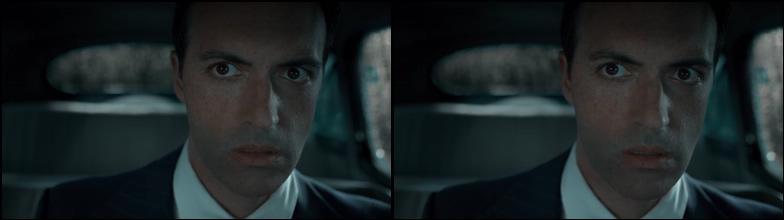


SHOT 51: frames 268 to 271 =======



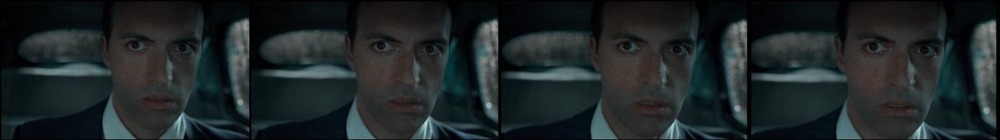


SHOT 52: frames 272 to 294 =======



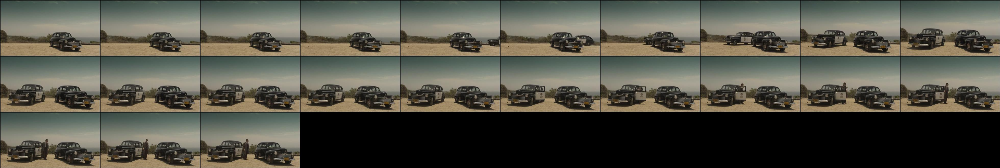


SHOT 53: frames 295 to 336 =======



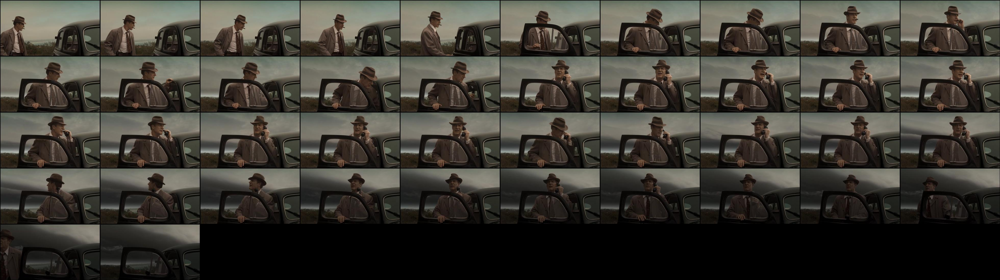


SHOT 54: frames 337 to 349 =======



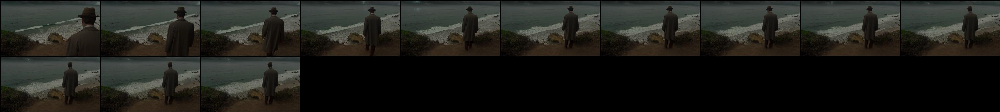


SHOT 55: frames 350 to 356 =======



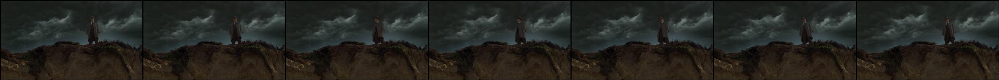


SHOT 56: frames 357 to 357 =======



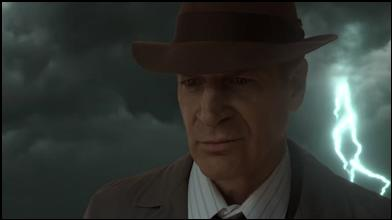


SHOT 57: frames 358 to 358 =======



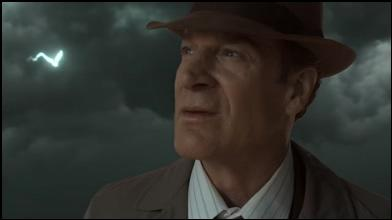


SHOT 58: frames 359 to 359 =======



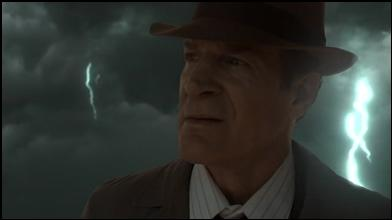


SHOT 59: frames 360 to 360 =======



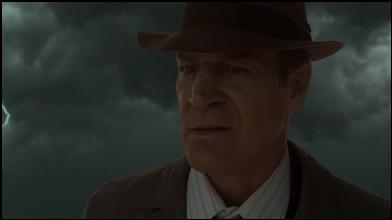


SHOT 60: frames 361 to 363 =======



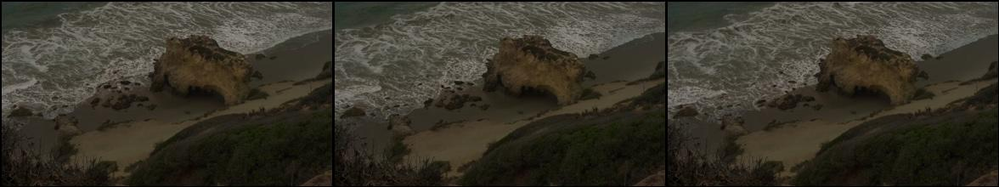


SHOT 61: frames 364 to 369 =======



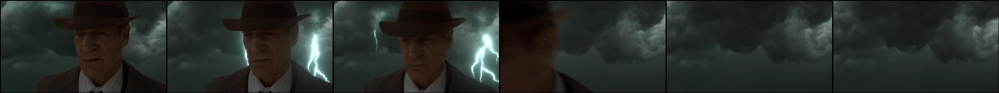


SHOT 62: frames 370 to 373 =======



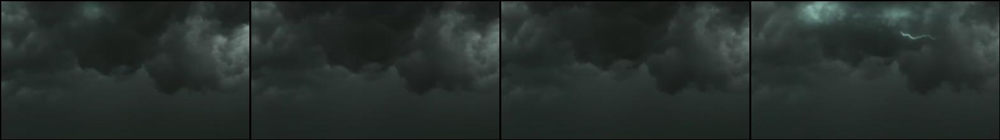


SHOT 63: frames 374 to 395 =======



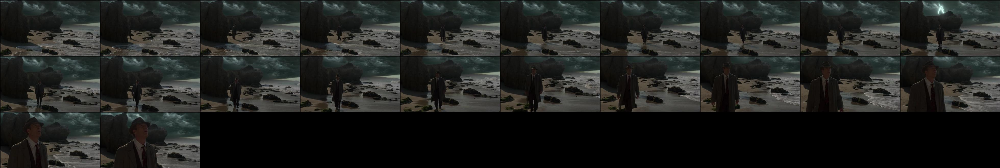


SHOT 64: frames 396 to 400 =======



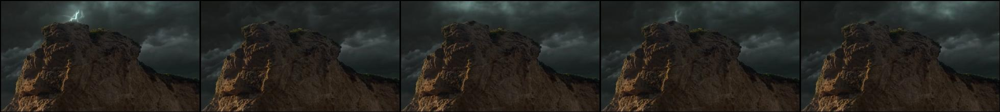


SHOT 65: frames 401 to 409 =======



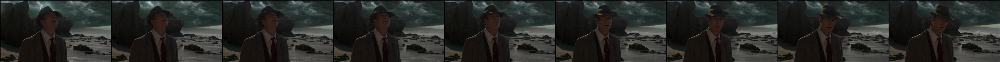


SHOT 66: frames 410 to 414 =======



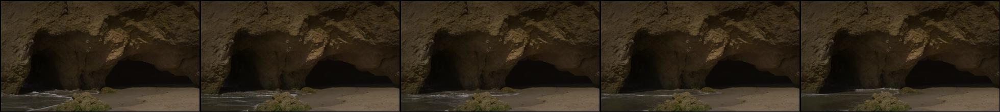


SHOT 67: frames 415 to 437 =======



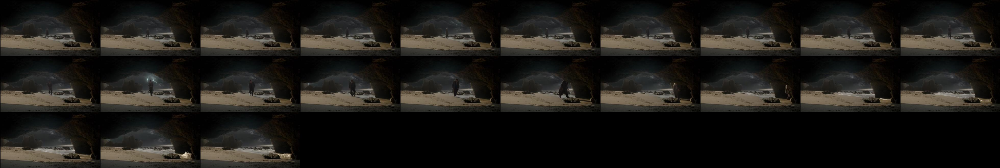


SHOT 68: frames 438 to 447 =======



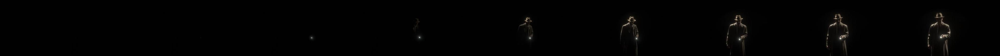


SHOT 69: frames 448 to 450 =======



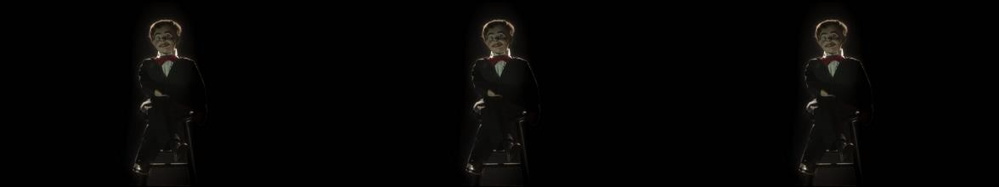


SHOT 70: frames 451 to 459 =======



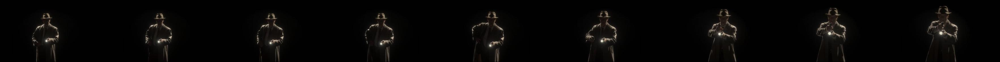


SHOT 71: frames 460 to 460 =======



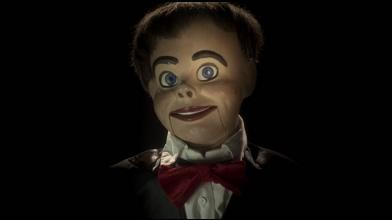


SHOT 72: frames 461 to 466 =======



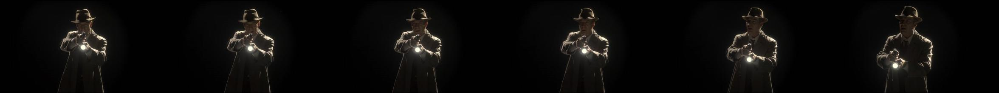


SHOT 73: frames 467 to 469 =======



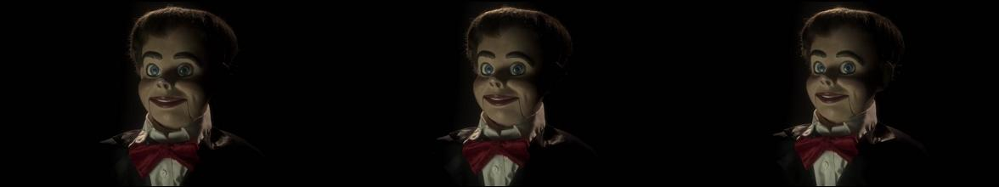


SHOT 74: frames 470 to 476 =======



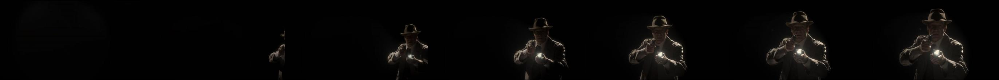


SHOT 75: frames 477 to 481 =======



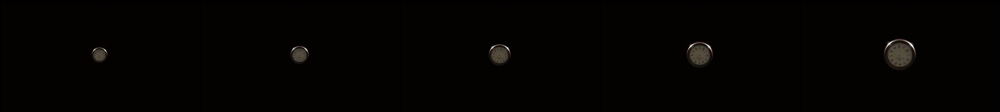


SHOT 76: frames 482 to 496 =======



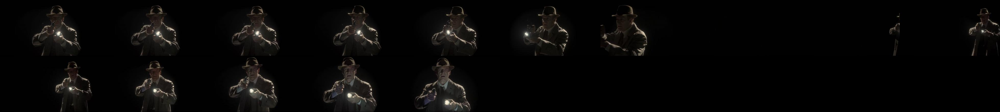


SHOT 77: frames 497 to 503 =======



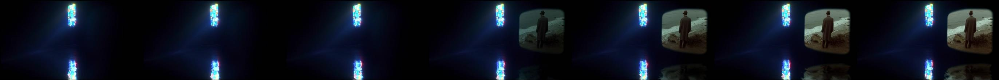


SHOT 78: frames 504 to 511 =======



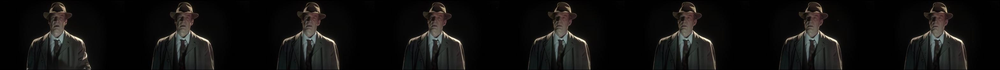


SHOT 79: frames 512 to 518 =======



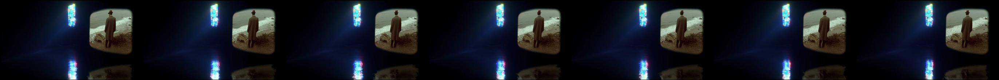


SHOT 80: frames 519 to 530 =======



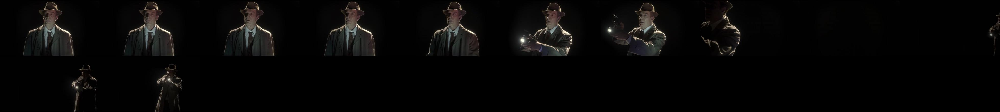


SHOT 81: frames 531 to 531 =======



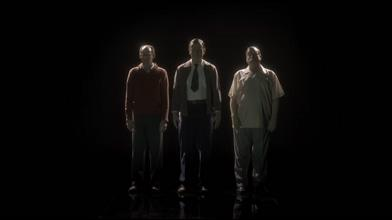


SHOT 82: frames 532 to 534 =======



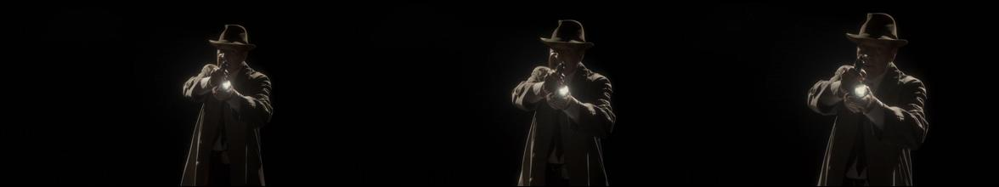


SHOT 83: frames 535 to 538 =======



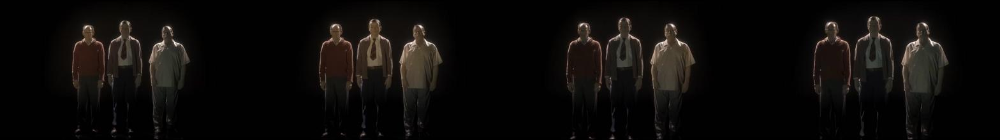


SHOT 84: frames 539 to 548 =======



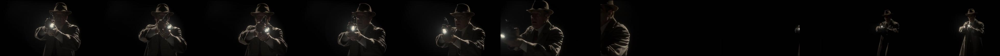


SHOT 85: frames 549 to 552 =======



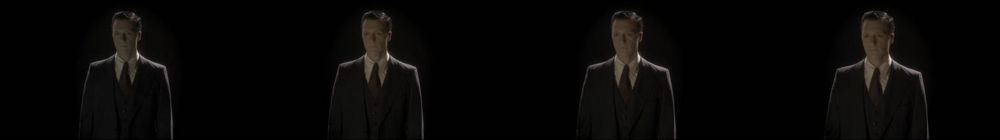


SHOT 86: frames 553 to 562 =======



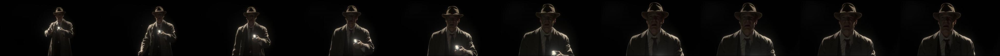


SHOT 87: frames 563 to 566 =======



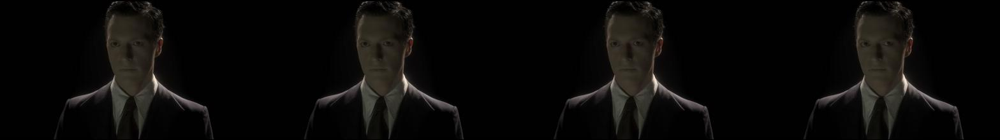


SHOT 88: frames 567 to 570 =======



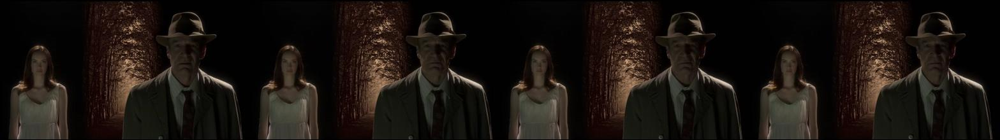


SHOT 89: frames 571 to 578 =======



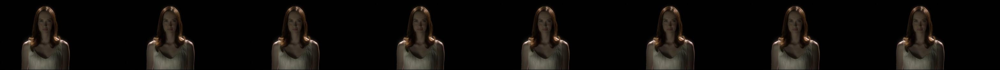


SHOT 90: frames 579 to 708 =======



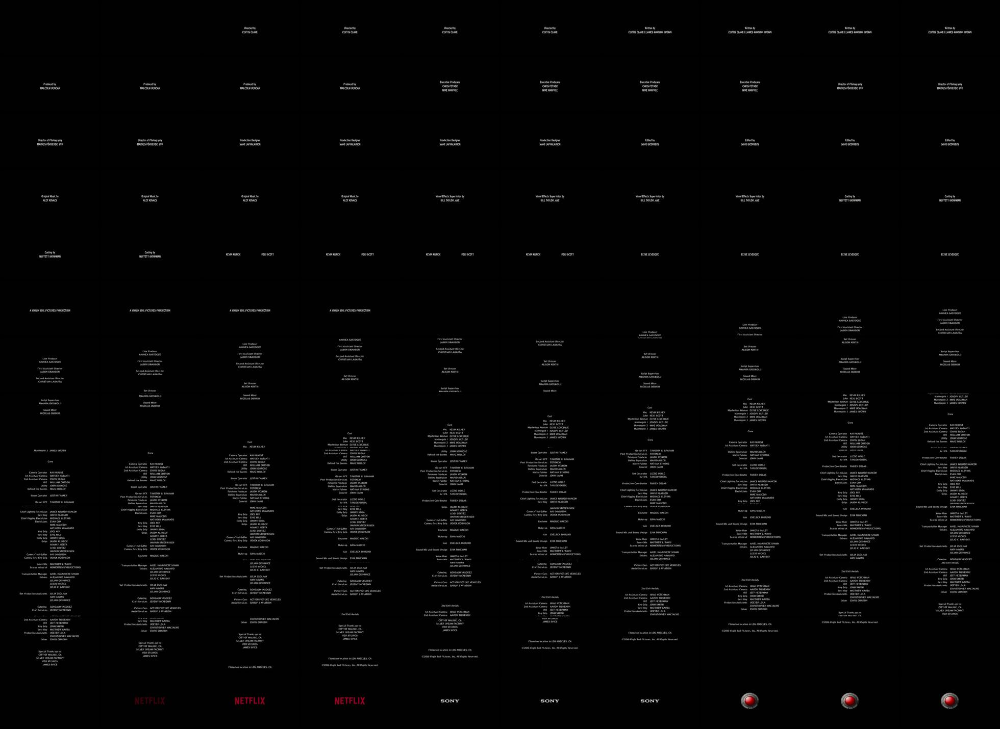


SHOT 91: frames 709 to 711 =======



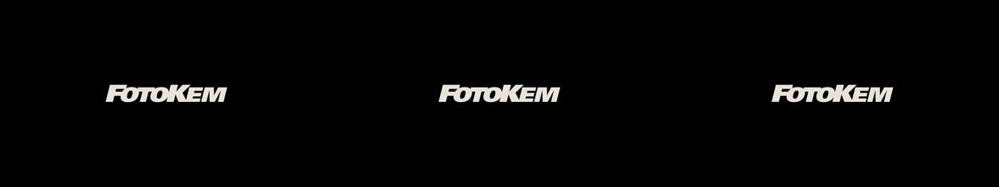


SHOT 92: frames 712 to 716 =======



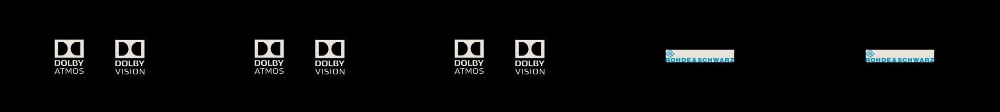


SHOT 93: frames 718 to 718 =======



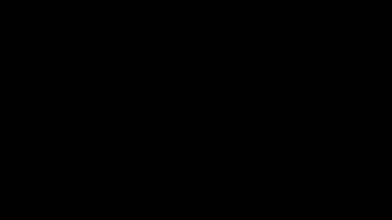

In [13]:
# visualize the shots
for counter, shot in enumerate(video["shots"].shots):
    print(f'\nSHOT {counter}: frames {shot["start_frame_id"] } to {shot["end_frame_id"] } =======\n')
    video['frames'].display_frames(start=shot["start_frame_id"], end=shot["end_frame_id"]+1)
    
    # ALTERNATIVE: Display composite images for each shot
    #for image_file in shot['composite_images']:
    #    display(DisplayImage(filename=image_file['file'], height=75))
    

<div class="alert alert-block alert-info">
💡 Use the scroll bar in the output box to view the shots in the cell above.  You can also drag the lower right corner to increase the size of the output cell.  
</div>

🤔 As you look through the lists of shots, do you notice any segments that have unexpected results?  If you do, you may have discovered some tricky situations for automatic video segmentation.  These include:
* Motion of the subject including rolling credits, cars, etc.
* Motion of the camera in the form of panning shots and zooming shots
* Fades and other transition effects


Before we move on to scene detection, let's play a couple of adjacent shots and observe how they will look as a video clip.  Play `shot[12]`.  

In [14]:
start = video['shots'].shots[12]['start_ms']/1000
end = video['shots'].shots[12]['end_ms']/1000
shot_url = f'{video["url"]}#t={start},{end}'
Video(url=shot_url, width=640, height=360)

Play `shot[13]`

In [15]:
start = video['shots'].shots[13]['start_ms']/1000
end = video['shots'].shots[13]['end_ms']/1000
shot_url = f'{video["url"]}#t={start},{end}'
Video(url=shot_url, width=640, height=360)

🤔 If you are running the workshop with Meridian, these shots show two people in the same room having a conversation that spans the shots.  Because these two shots are in the same setting, they belong together into a higher level grouping.  In the next section, we'll group shots together based on the visual information to get a more holistic view of the scene.

# Detect scenes


Even after identifying individual camera shots, there may still be semantically similar shots depicting the same setting. To further cluster these into distinct scenes, we expand frame comparison beyond adjacent frames. By looking at similar frames across an expanded time window, we can identify shots that are likely part of the same contiguous scene. We calculate pairwise similarity scores between all frames within a given time window. Frames with similarity scores above a certain threshold are considered part of the same scene group. This process performs recursively across all frames in a shot. 

<div class="alert alert-block alert-info">
💡 The time window size and similarity threshold are parameters that can significantly impact the accuracy of scene boundary detection. In our example, a 30 second time window and 0.80 similarity threshold gave the best scene clustering results across our video samples, but this can be adjusted.
</div>

We accomplish scene grouping by first indexing all video frames using TME again and storing the embeddings along with their shot information and timestamps into a vector database, as illustrated in the following figure.

![shots-to-scenes.png](./static/images/01-vectorization.jpg)

We then perform a recursive similarity search against this indexed frame corpus. For each frame, we find all other frames within a 3-minute time window in both directions with greater than 80% contextual similarity based on their vector representations. The shot information for these highly similar frames is recorded. This process iterates for all frames in a shot to compile contextually similar shots. This process repeats across all shots, and the compiled results look like this example:

    shot 1 –> 2, 3, 4
    shot 2 –> 1, 3
    shot 3 –> 2, 4, 5
    shot 7 –> 8, 9

Finally, we run a reduction process to group shots that are mutually identified as highly similar into distinct scene groups as follows:

    shot 1, 2, 3, 4, 5 → scene 1
    shot 7, 8, 9 → scene 2

This allows us to segment the initially detected shot boundaries into higher-level semantic scene boundaries based on visual and temporal coherence. The end-to-end process is illustrated in the following diagram.

### Create frame embeddings

Image embeddings are numerical representations (vectors) of images that capture their essential features and characteristics.  These embeddings make it possible to perform mathematical operations on images and compare them in ways that align with human visual perception.  

We'll create an image embedding for each frame from our video using [Amazon Titan Multimodal Embeddings](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-multiemb-models.html) in Amazon Bedrock.  We'll be using helper functions in the [lib/frames.py](./lib/frames.py) to accomplish this task.  

The calculated frame embeddings will be added to each frame in the `Frames` object that is stored in the `video` variable.

Calling the method `make_titan_multimodal_embeddings()` from the `Frames` class will create frame embeddings and store them with the metadata for each frame.  



<div class="alert alert-block alert-info">
If you get an <b>AccessDenied</b> error at this point, make sure you completed the step to enable model access for Amazon Titan Multimodal Embeddings and Amazon Nova model in the Amazon Bedrock console.
</div>

<div class="alert alert-block alert-info">
⏳ Generating embeddings for our sample videos should take 2-5 minutes.  To speed things up, we will load precomputed embeddings.  
</div>

In [16]:
# workshop FASTPATH setting uses pre-calculated embeddings for the video, set FASTPATH=false to regenerate embeddings
FASTPATH = True
if FASTPATH:
    video['frames'].load_titan_multimodal_embeddings()
else:
    video['frames'].make_titan_multimodal_embeddings()

  load_fastpath_results: loaded frames from ./fastpath/Netflix_Open_Content_Meridian/frames-embeddings.json


Use the next cell to print the metadata for the first frame and examine the `titan_multimodal_embedding` attribute.   It's a large vector that encodes the content of the frame in the vector space for the `amazon.titan-embed-image-v1` version of the Titan Multimodal Embeddings model.  When we compare this vector with other vectors encoded using the same model version, we can determine if they are similar.

In [17]:
display(JSON(video["frames"].frames[0], root="first frame"))

<IPython.core.display.JSON object>

Next, lets do some comparisons of the first few frames using embeddings.  First, print a few of the sampled frames.

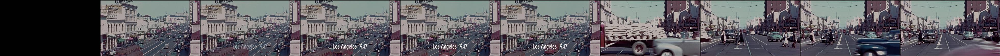

In [18]:
video['frames'].display_frames(start=0, end=10)

In order to compare frames, we need a way to compare embeddings.  We'll implement a [cosine similarity](https://en.wikipedia.org/wiki/Cosine_similarity) function using the Python numpy package.

In [19]:
import numpy as np
from numpy import dot
from numpy.linalg import norm

def cosine_similarity(a, b):
    cos_sim = dot(a, b) / (norm(a) * norm(b))
    return cos_sim

## Next, let's test comparing some frames.

Compare the first black frame to a frame that has contet.  For Meridian, we can choose the second frame which is a view of a city street.  As expected, the similarity score is low as these frames are not very similar.

In [20]:
frms = video['frames'].frames
cosine_similarity(frms[0]['titan_multimodal_embedding'], frms[2]['titan_multimodal_embedding'])

0.36122982244197366

Now, compare two frames that look similar.  For Meridian, we can compare the second frame to the third frame.  The similarity score should be higher, since the main difference in these frames is the lettering with the words "Los Angeles 1947".

In [21]:
cosine_similarity(frms[1]['titan_multimodal_embedding'], frms[2]['titan_multimodal_embedding'])

0.9317165791077363

### Populate a FAISS vector store

We will be using a local FAISS vector store so we can use a single search command to find all the frames that are similar to a particular frame all at once.  Our search function will use the same cosine similarity method we explored in the previous section. There are a number of different databases on AWS that can be used as a vector store.  One popular choice is [Amazon Opensearch](https://aws.amazon.com/opensearch-service/). 

In [22]:
video['frames'].make_vector_store()

### Test similarity search using the vector store

Let's use the vector store to find similar frames for the second frame in the video.  This is the first frame of the sequence that displays the words "Los Angeles 1947".  Based on inspection of the frames, we should get 3 _adjacent_ similar frames, but there are also several similar frames that are not adjacent.   

Our similarity search function uses a [cosine similarity function](https://en.wikipedia.org/wiki/Cosine_similarity) to determine the [K nearest neighbors](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm) in the vector space. There are two parameters that you can adjust to tune the result of the similarity search:

* MIN_SIMILARITY is the similarity threshold.  
* TIME_RANGE is the maximum time range to compare frames to from the input frame

You can try different values of these parameters to get a feel for how the results change. The frames 0-19 are displayed after this to help visualize  the results.  Here are some good values to try:

* MIN_SIMILARITY = .85, TIME_RANGE = 30
* MIN_SIMILARITY = .70, TIME_RANGE = 30
* MIN_SIMILARITY = .80, TIME_RANGE = 3

In [23]:
MIN_SIMILARITY = .80
TIME_RANGE = 30
FRAME_ID = 1
video['frames'].search_similarity(FRAME_ID, min_similarity = MIN_SIMILARITY, time_range = TIME_RANGE)

[{'idx': 1, 'similarity': 1.0},
 {'idx': 1, 'similarity': 1.0},
 {'idx': 2, 'similarity': 0.9317165613174438},
 {'idx': 3, 'similarity': 0.873681902885437},
 {'idx': 4, 'similarity': 0.8669285178184509},
 {'idx': 5, 'similarity': 0.8724959492683411},
 {'idx': 7, 'similarity': 0.8346746563911438},
 {'idx': 8, 'similarity': 0.8606103658676147},
 {'idx': 9, 'similarity': 0.9097588658332825},
 {'idx': 10, 'similarity': 0.8679388761520386},
 {'idx': 11, 'similarity': 0.8631496429443359},
 {'idx': 12, 'similarity': 0.8604780435562134},
 {'idx': 13, 'similarity': 0.8847745656967163},
 {'idx': 14, 'similarity': 0.8241358995437622},
 {'idx': 15, 'similarity': 0.8076341152191162}]

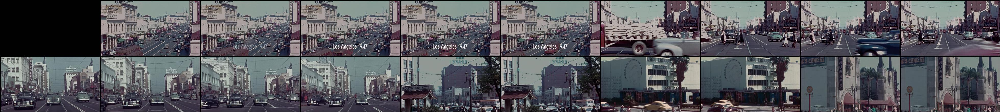

In [24]:
video['frames'].display_frames(start=0, end=20)

### Scenes library

<div class="alert alert-block alert-info">
<b>Note</b>: The code for scene detection is located in the <b>lib</b> folder of this project if you want to dive deeper, but the objective of this exercise is to understand the concept of a scene.    
</div>

Click the link to open [lib/scenes.py](lib/scenes.py)


### Execute the Scene detection

Now let's apply this similarity search to all the frames across shots to find similar shots.  If shots are similar within the TIME_RANGE, then they will be grouped to the same scene.


In [25]:
MIN_SIMILARITY = .80

TIME_RANGE = 30

video['scenes'] = Scenes(video['frames'], video['shots'].shots, MIN_SIMILARITY, TIME_RANGE)

Scene #0: 0 - 0 (1)
Scene #1: 1 - 4 (4)
Scene #2: 5 - 5 (1)
Scene #3: 6 - 6 (1)
Scene #4: 7 - 7 (1)
Scene #5: 8 - 8 (1)
Scene #6: 9 - 34 (26)
Scene #7: 35 - 35 (1)
Scene #8: 36 - 51 (16)
Scene #9: 52 - 52 (1)
Scene #10: 53 - 53 (1)
Scene #11: 54 - 67 (14)
Scene #12: 68 - 88 (21)
Scene #13: 89 - 89 (1)
Scene #14: 90 - 93 (4)


### Visualize the scenes

Now let's visualize some scenes using the generated composite images. Note that some scenes will have more than one composite image.


🤔 Do you think the scenes grouped the shots in a way that makes sense?  Is there anything you would want to change?


Scene 0: frames 0 to 0 =======



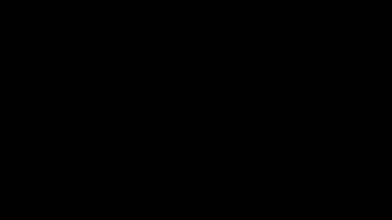


Scene 1: frames 2 to 15 =======



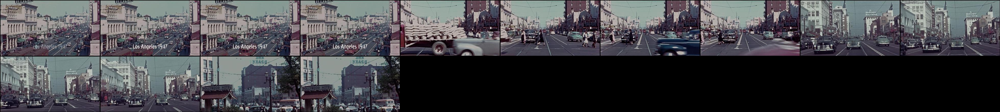


Scene 2: frames 16 to 17 =======



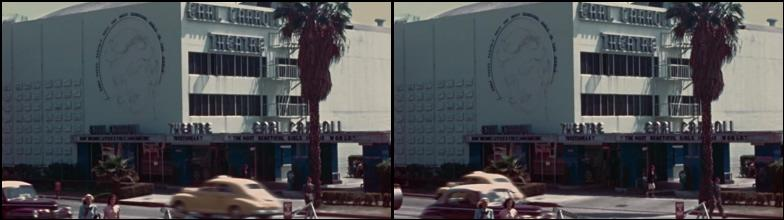


Scene 3: frames 18 to 20 =======



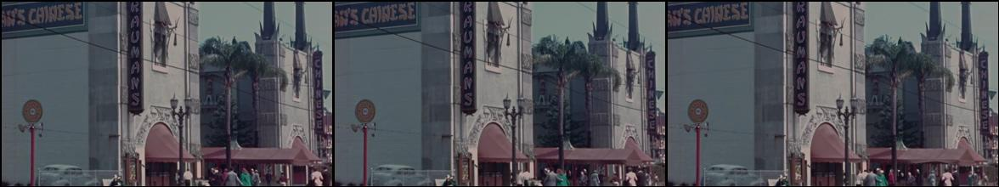


Scene 4: frames 21 to 23 =======



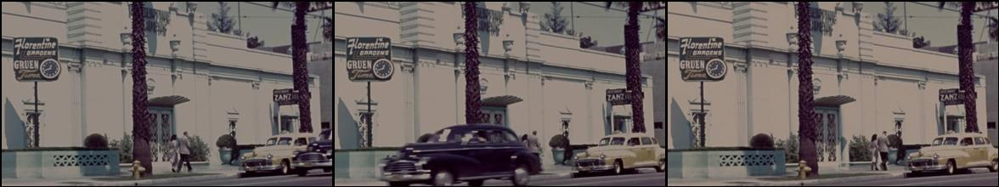


Scene 5: frames 24 to 29 =======



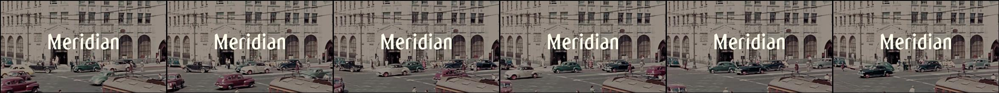


Scene 6: frames 30 to 197 =======



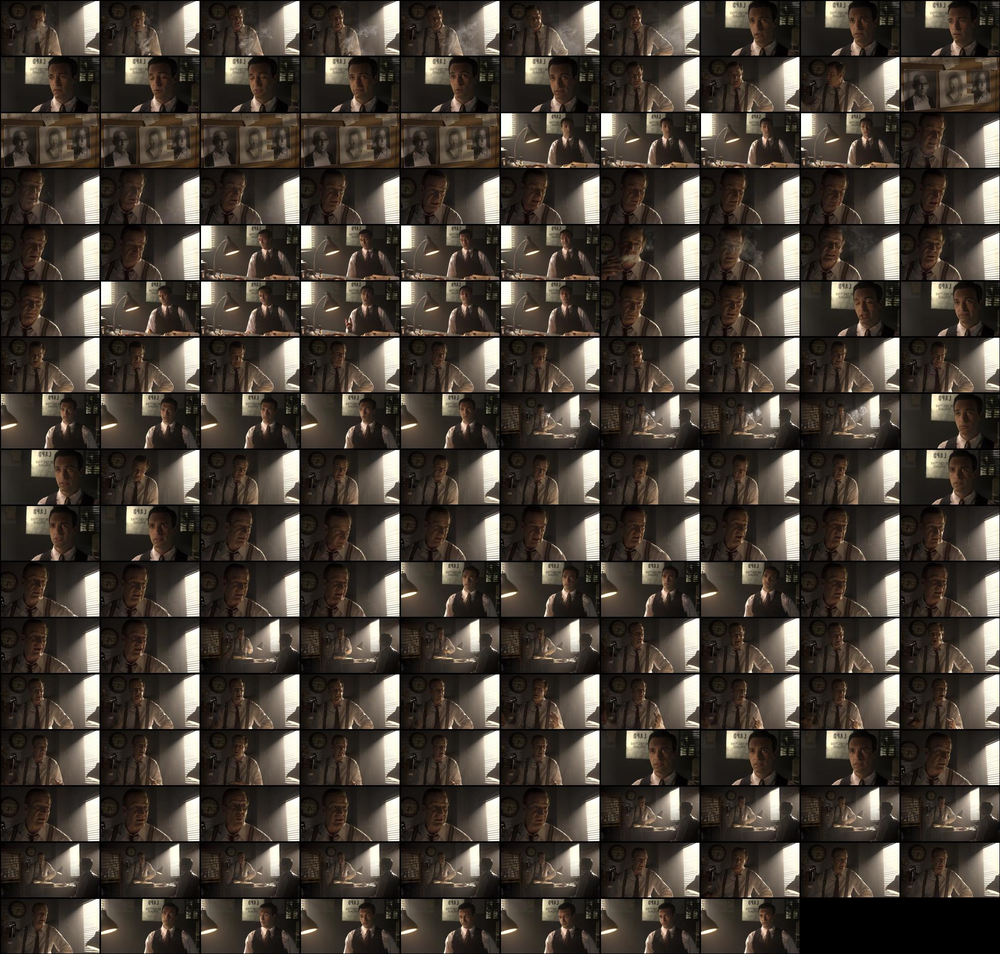


Scene 7: frames 198 to 204 =======



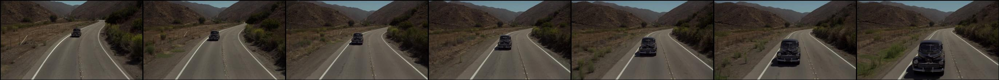


Scene 8: frames 205 to 271 =======



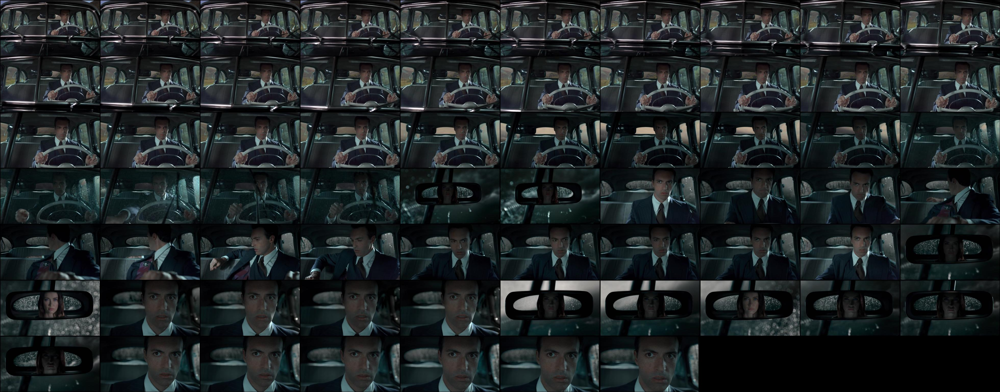


Scene 9: frames 272 to 294 =======



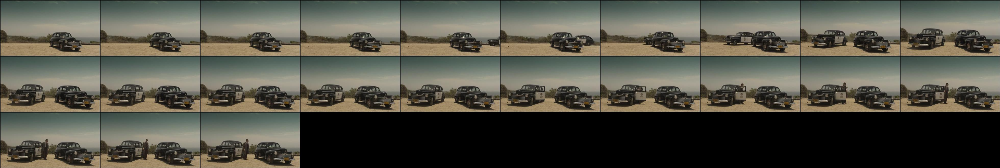


Scene 10: frames 295 to 336 =======



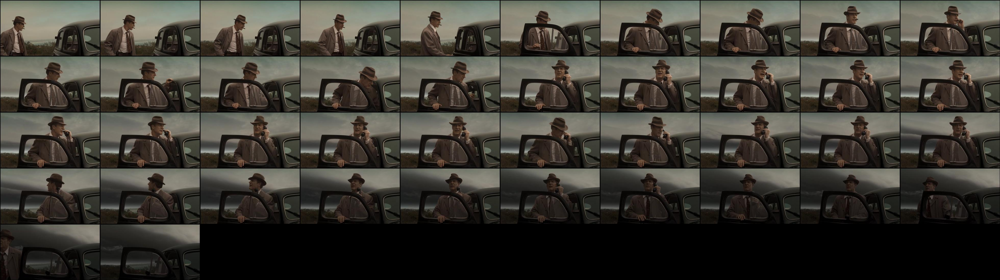


Scene 11: frames 337 to 437 =======



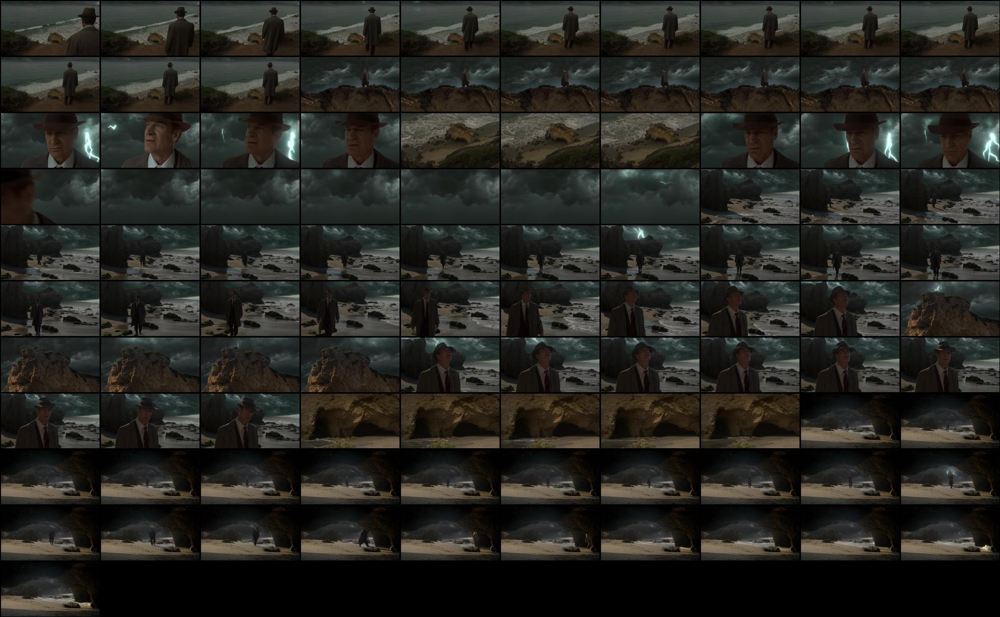


Scene 12: frames 438 to 570 =======



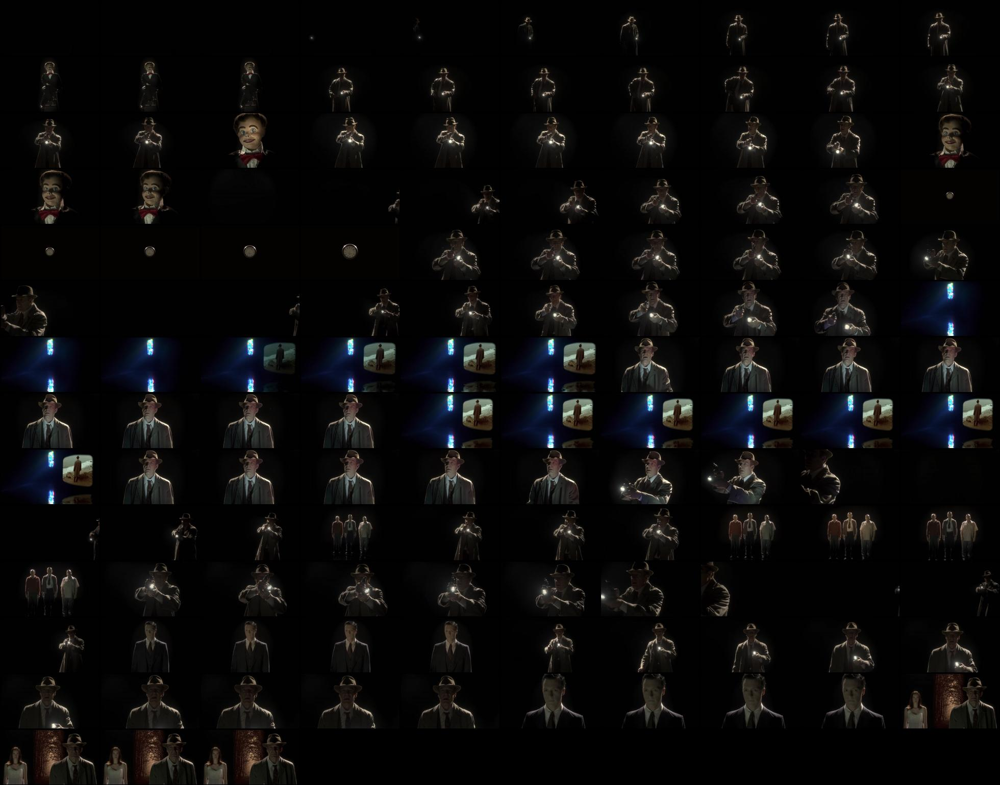


Scene 13: frames 571 to 578 =======



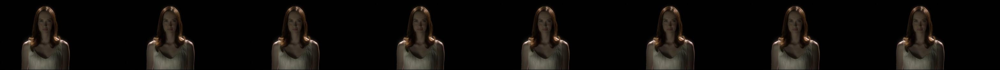


Scene 14: frames 579 to 718 =======



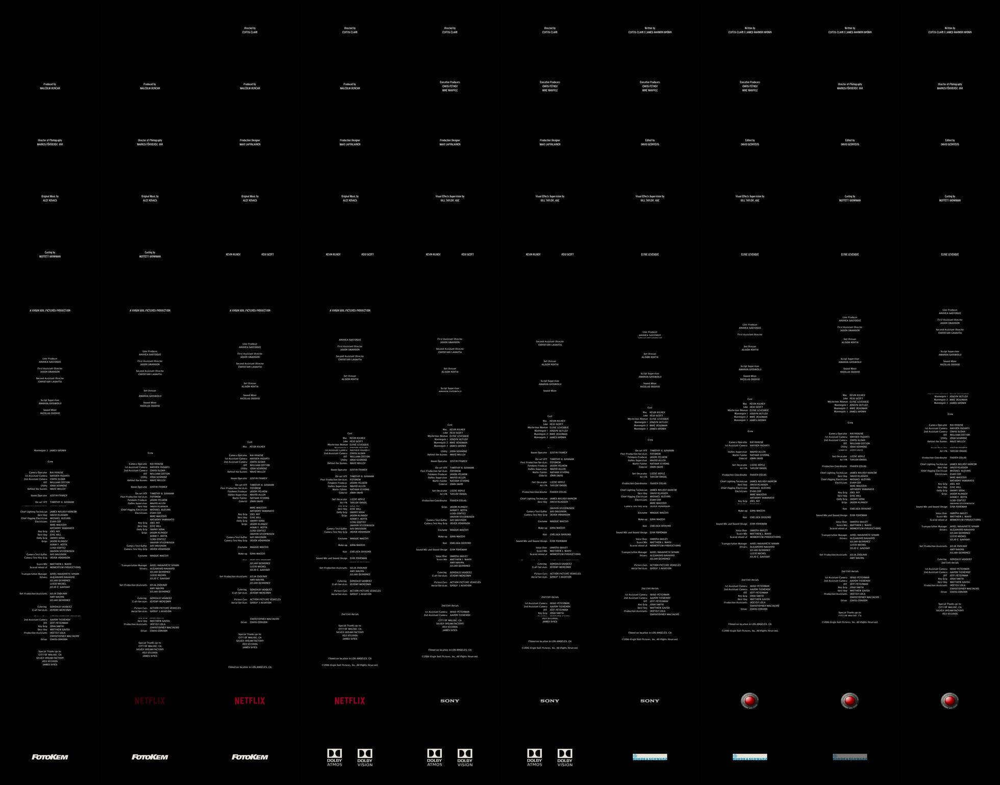

In [26]:
# visualize the scenes
for counter, scene in enumerate(video["scenes"].scenes):
    print(f'\nScene {counter}: frames {scene["start_frame_id"] } to {scene["end_frame_id"] } =======\n')
    video['frames'].display_frames(start=scene["start_frame_id"], end=scene["end_frame_id"]+1)

<div class="alert alert-block alert-info">
💡 Make sure to use the scroll bar in the output box above to view the scenes.  You can also drag the lower right corner to increase the size of the output cell.  
</div>


Finally, let's play a couple of adjacent scenes and observe how they will look as a video clips. As you play the video segments, pay attention to the transition of the _video and the audio_ from one scene to the next.  Because the scenes are created based on only the visual information, the audio can get cut off if you clip on a scene boundary.  In the next notebook, we'll look at the audio segmentation of videos. 

In [27]:
start_scene = 10
start = video['scenes'].scenes[start_scene]['start_ms']/1000
end = video['scenes'].scenes[start_scene]['end_ms']/1000
print(f"scene { start_scene } duration: {video['scenes'].scenes[start_scene]['duration_ms']/1000} seconds\n")
print(f"start time: { start } end time: {end} seconds\n")
shot_url = f'{video["url"]}#t={start},{end}'
Video(url=shot_url, width=640, height=360)

scene 10 duration: 41.741 seconds

start time: 294.728 end time: 336.469 seconds



Play the next scene.

In [28]:
start_scene = start_scene + 1
start = video['scenes'].scenes[start_scene]['start_ms']/1000
end = video['scenes'].scenes[start_scene]['end_ms']/1000
print(f"scene { start_scene } duration: {video['scenes'].scenes[start_scene]['duration_ms']/1000} seconds\n")
print(f"start time: { start } end time: {end} seconds\n")
shot_url = f'{video["url"]}#t={start},{end}'
Video(url=shot_url, width=640, height=360)

scene 11 duration: 101.368 seconds

start time: 336.503 end time: 437.871 seconds




🤔 We just played scenes 10 and 11.  You may have noticed that the scene changed on a visual cue when the focus of the video turns towards the beach and the ocean.  _However_, this scene change occurs in the middle of the audio of the police dispatcher speaking over the radio.  If we want to identify clean breakpoints in the video to make clips, we should probably consider not only the visual content but the audio as well. We'll explore this topic in the next part of the workshop [01B Combining Audio and Video Segments](./01B-combining-audio-and-video.ipynb).  But, before we move on, let's do our first exploration of prompt engineering with video segments.

# Prompting a multimodal Foundation Model with video segments

Amazon Nova models, particularly Nova Lite and Pro, offer advanced multi-modal understanding capabilities, processing image and video inputs to generate text outputs.In this section, you can explore two differnt approaches to analyze the video segments using Amazon Nova foundation models: 

**1) Converting video segment into sequential image frames, which are then consolidated into composite frame grids to optimize processing efficiency**

**2) Direct video segment analysis by feeding video content straight into the Amazon Nova model**

Each approach offers unique advantages depending on the specific use case requirements. For instance, the frame-based processing method provides greater control over frame resolution and sampling rates, while direct video analysis may have less configuration control but provides better temporal understanding.

## Option 1 - Frame Analysis using Amaozn Nova Model

Every scene and shot you generated in this lab has a set of composite image that has been stored in a folder.  Execute this cell to get the name of the folder.  The `shots` and `scenes` subfolders contain the composite images we have been creating in this lab. You will send these composite images to mutli-modal foundation models like Amazon Nova to generate contextual rich analysis.

![Prompt engineering with frame sequences](./static/images/01-prompt-engineering-with-frame-sequences.png)

Also, Bedrock's Converse API provides developers with a consistent interface to interact with different foundation models. Simply modify the `model_id` below to try this solution with other multi-modal foundation on Amazon Bedrock.

In [29]:
MAX_RETRIES = 50
INITIAL_BACKOFF = 5
bedrock_client = boto3.client(service_name="bedrock-runtime")
account_id = get_account_id()
region = bedrock_client.meta.region_name

model_id = "us.amazon.nova-pro-v1:0"

# uncommon below to try this with Anthropic Claude Sonnet 3
# model_id = "us.anthropic.claude-3-sonnet-20240229-v1:0"

Helper functions for invoke the foundation model

In [30]:
def invoke_model_with_retry(messages, modelId, infoParams, additionalFields):
    retries = 0
    backoff = INITIAL_BACKOFF

    while retries < MAX_RETRIES:
        try:
            response = bedrock_client.converse(
                modelId=modelId,
                messages=messages,
                inferenceConfig=infoParams,
                additionalModelRequestFields=additionalFields,
            )
            return response
        except ClientError as e:
            error_code = e.response['Error']['Code']
            print(e)
            print(f"Error: {error_code}. Retrying in {backoff} seconds...")
            time.sleep(backoff)
            retries += 1
            backoff += 1
    
    raise Exception("Max retries reached. Unable to invoke model.")


def generate_segment_description(images, messages):
    """
    Generate a natural language description of a video shot using LLM in Amazon Bedrock
    Args:
        shot - Dictionary containing shot information including:
                - id: unique identifier for the shot
                - start_ms: start time of the shot in milliseconds
                - end_ms: end time of the shot in milliseconds
                - composite_images: visual representation that combine multiple frames from a single shot into one image
              
    Returns:
        response_body - String containing the generated description of the visual content in the shot based on the analyzed frames
    """

    info_params = {"maxTokens": 512, "topP": 0.1, "temperature": 0.1}

    response = invoke_model_with_retry(
        messages=messages, 
        modelId=model_id, 
        infoParams=info_params, 
        additionalFields={}
    )
    
    response_body = response["output"]["message"]["content"][0]["text"]

    return response_body

Open a couple of images to see what they look like.  In the next cell you will create some prompts to understand the video segments using the composite images.  

1. You can set the `IMAGES` variable to the `composite_images` attribute of any shot or scene you want.
2. You can also change the instructions in the PROMPT to see how it changes the results.

We'll be using similar prompts in later labs to contextualize video segments to support different use cases.

Here are some alternative IMAGES you can try.  Copy and paste them into the cell below to replace the `IMAGES` assignment:

 ```
    IMAGES = video['scenes'].scenes[15]['composite_images']
    IMAGES = video['scenes'].scenes[20]['composite_images']
    IMAGES = video['shots'].shots[92]['composite_images']
    IMAGES = video['shots'].shots[61]['composite_images']
    IMAGES = video['shots'].shots[35]['composite_images']
```

In [31]:
SHOT_NUM = 61
IMAGES = video['shots'].shots[SHOT_NUM]['composite_images']

PROMPT = f"""Provide a concise one or two sentence description of a video clip.
        The input video clip is presented as a sequence of images each 
        containing a grid of frames sampled from a video.  The frames in each
        image are organized in time sequence reading left to right and top to bottom.  
        1. Classify the genre of the clip as Science Fiction, Comedy, Mystery and 
           Suspense, Horror, Drama, Documentary, or Other.
        2. The description should be a narration of a story to describe the important 
           visual information in the clip.  Use the genre to determine 
           the style of the narration.  Do not refer to video frames or clips, instead 
           observe the story in the clip.  Only narrate what you see in the
           clip.  Ensure that you include all the actions of
           the main people in the clip even if there are more than one action.  
           Example: "the woman puts the book on the shelf and turns to face
           the girl standing behind her..." You are careful to throuroughly 
           examine all the frames before giving the output.  Skip the 
           preamble; go straight into the description.
        3. If there is nothing to narrate describe what is shown in the clip.
        3. Provide the output in JSON only
        Think step by step"""

In [32]:
messages = [
        {
            "role": "user",
            "content": [
                {"text": PROMPT},
            ],
        }
    ]

for image in IMAGES:
    with open(image['file'], "rb") as f:
        file_content = f.read()

        messages[0]["content"].append({
            "image": {
                "format": "jpeg",
                "source": {
                    "bytes": file_content,
                },
            }
        })

CPU times: user 2 μs, sys: 0 ns, total: 2 μs
Wall time: 5.25 μs


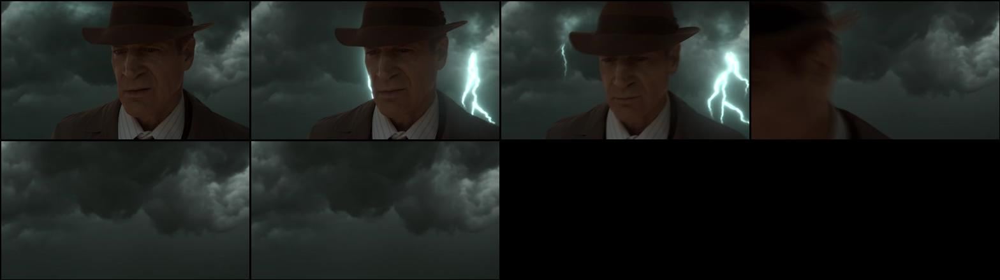

<IPython.core.display.JSON object>

In [33]:
%time 
response = generate_segment_description(IMAGES, messages)

response_json = json.loads(response)

for image in IMAGES:
    display(DisplayImage(f"{image['file']}", width=600))

display(JSON(response_json, root="respone"))

## Option 2 - Video Analysis using Amaozn Nova Model

Now you will try the same thing using the video segments instead of composite frames. In the previous steps, you already have the shot level informations including the start and end timestamp. You can split the video base on the timestamp and send each segment as a whole video to be analyzed.

Helper functions to split the video

In [34]:
def ms_to_time_str(milliseconds):
    """
    Convert milliseconds to a time string in HH:MM:SS format.
    
    Args:
        milliseconds (int): Time in milliseconds
        
    Returns:
        str: Formatted time string in HH:MM:SS format
    """
    # Convert to total seconds
    total_seconds = milliseconds // 1000
    
    # Calculate hours, minutes, and remaining seconds
    hours = total_seconds // 3600
    minutes = (total_seconds % 3600) // 60
    seconds = total_seconds % 60
    
    # Format as HH:MM:SS
    return f"{hours:02d}:{minutes:02d}:{seconds:02d}"

In [35]:
def cut_video_clip(input_path, output_path, start_time, end_time):
    """
    Cut a video clip from the input video based on start and end times.
    
    Args:
        input_path (str): Path to the input video file
        output_path (str): Path where the output clip will be saved
        start_time (str): Start time in format "HH:MM:SS" or "MM:SS"
        end_time (str): End time in format "HH:MM:SS" or "MM:SS"
    """
    try:
        stream = ffmpeg.input(input_path, ss=start_time, to=end_time)
        stream = ffmpeg.output(stream, output_path, acodec='copy', vcodec='copy')
        ffmpeg.run(stream, overwrite_output=True, capture_stdout=False, capture_stderr=True)
    except ffmpeg.Error as e:
        print(f"Error creating clip: {e.stderr.decode()}")


Slice the video into shot se

In [36]:
# Format shot start and end timestamp
shot_start_time = ms_to_time_str(video['shots'].shots[SHOT_NUM]['start_ms'])
shot_end_time = ms_to_time_str(video['shots'].shots[SHOT_NUM]['end_ms'])

output_file = f"shot_{SHOT_NUM}.mp4"
cut_video_clip(video['path'], output_file, shot_start_time, shot_end_time)

In [37]:
with open(output_file, "rb") as video_file:
    file_content = video_file.read()

messages = [
        {
            "role": "user",
            "content": [
                {
                    "video": {
                        "format": "mp4",
                        "source": {
                            "bytes": file_content
                        },
                    }
                },
                {"text": PROMPT},
            ],
        }
    ]

CPU times: user 4 μs, sys: 1 μs, total: 5 μs
Wall time: 7.39 μs


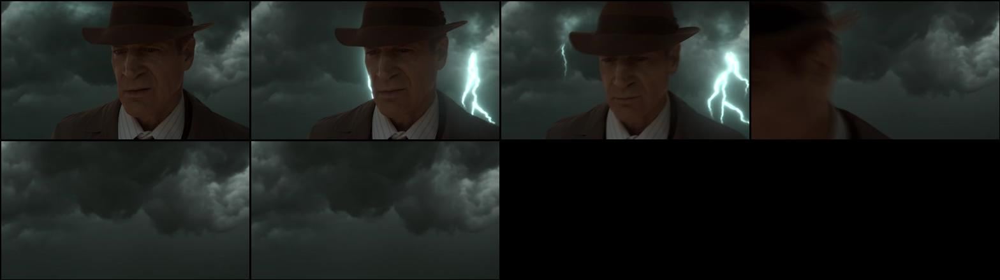

<IPython.core.display.JSON object>

In [38]:
%time 
response = generate_segment_description(IMAGES, messages)

response_json = json.loads(response)

for image in IMAGES:
    display(DisplayImage(f"{image['file']}", width=600))

display(JSON(response_json, root="respone"))

🤔 Now that you have tried a few simple prompts with video segment, think about the quality of the results.  You may have found there were points where the results were good, and maybe you found some inaccurate results.  The prompt we gave here is very basic.  There are a many prompt engineering techniques that can help tune the results to suit different use cases.  Some of these techniques include:

1. Providing additional context, such as the transcript for a clip, the names of the characters in a scene generated from Rekognition Face Search API, or a summarization of the plot of the video up to this point.
2. Using prompt flows to break down the prompt into multiple prompts.  For example, you can write a prompt for the classification of the clip and another prompt to generate the scene description.  Some advantages of using this technique include being able to use different prompts for downstream tasks based on results from earlier prompts and enabling use of different FMs for different parts of the task.  Prompt flows can help control costs and improve quality.
3. Adding a system prompt to provide the FM with a role and overall guidelines.
4. Using negative prompts to correct for situations where the FM performs poorly.
6. Decreasing the number of frames packed in the grid to increase the image resolution.
7. Changing the segmentation (or groups of frames) to fit the use case.  For example, you may have different tasks you want to perform on the pre-roll, main content and credits of a video.

There are many possibilities.  But, even with simple prompts, you can get useful results.

# What's next?

### Store the video metadata so it can be used in the rest of the workshop.

In [39]:
%store video

Stored 'video' (dict)


### Continue to the next section of the workshop

In the next sections of the workshop, you will use Amazon Transcribe to generate a transcript from the speech within the video.  The transcript provides additional information that can be used to find segments based on the context of the video narrative.  The transcript can also be used to provide more input context in prompts for video clips.

Go to the next notebook [Audio Segments](./01B-audio-segments.ipynb).